In [37]:
import cv2
import matplotlib.pyplot as plt
#from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [38]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (2.0, 2.0)

matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5, 1.0, 'Original Image')

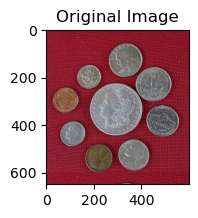

In [39]:
# Image path
import os
__location__ = os.path.realpath(os.getcwd())
filename=os.path.join(__location__, 'SolidCoins.png')

###Read the image
image= cv2.imread(filename,cv2.IMREAD_COLOR)

imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

Text(0.5, 1.0, 'Grayscale Image')

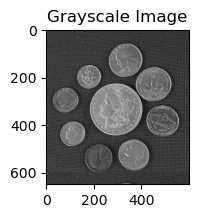

In [40]:
# Convert image to grayscale
# Store it in the variable 'imageGray'
imageGray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

plt.imshow(imageGray);
plt.title("Grayscale Image")

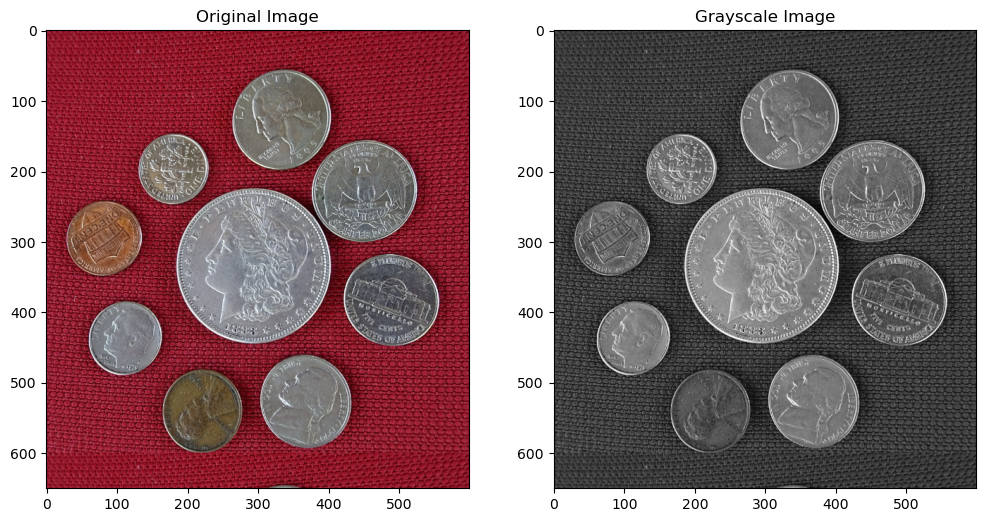

In [41]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

In [42]:
# Split cell into channels
# Store them in variables 'imageB', 'imageG', 'imageR'

imageB,imageG,imageR = cv2.split(image)


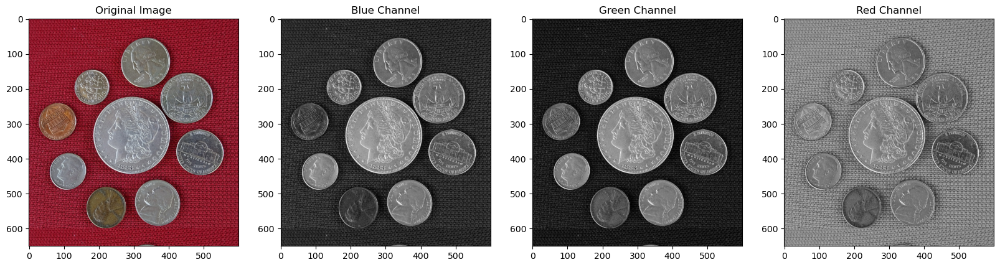

In [43]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

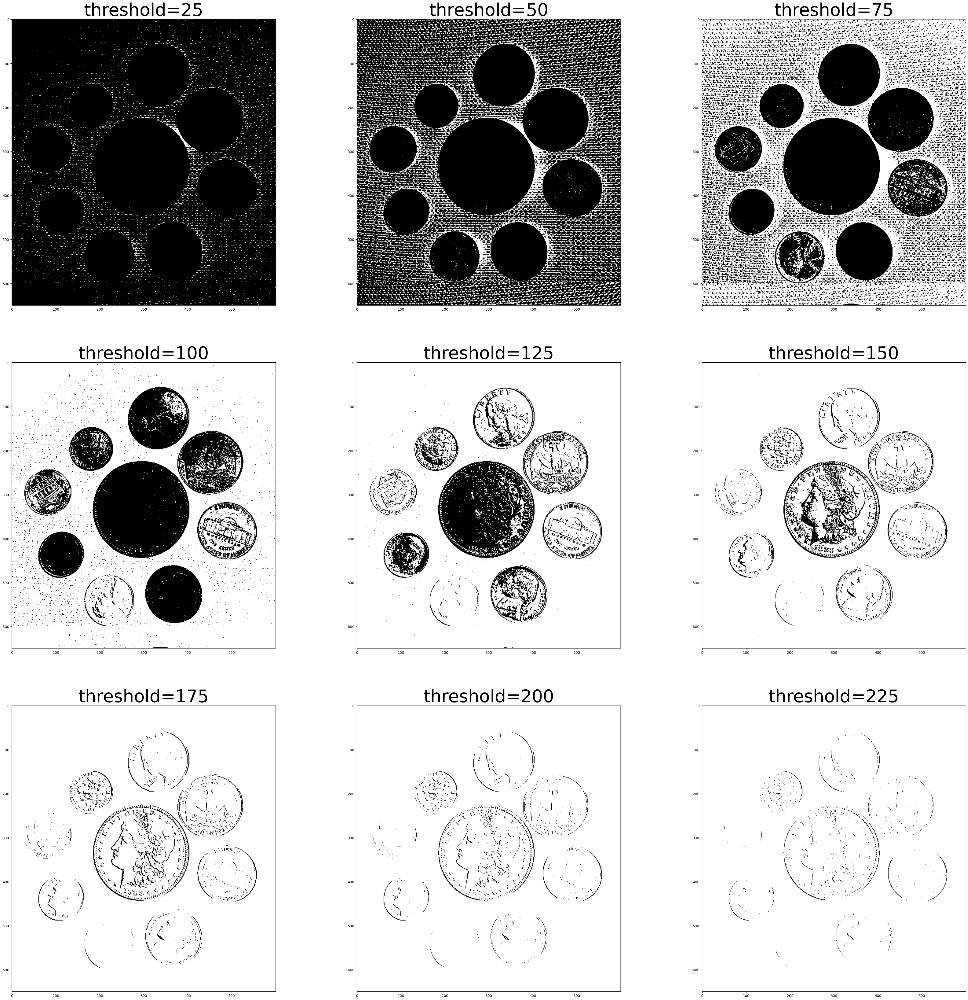

In [44]:
# run through a rough list of threshhold values and 
# identify the range to review threshold values in details in the next step
# The goal is to identify the image with dark coins and white background 
# without much small residual spots.

maxValue=255
image_array=[]

for thresh in range(25,250,25):
    th, dst = cv2.threshold(imageGray, thresh, maxValue, cv2.THRESH_BINARY_INV)
    image_array.append(dst)

plt.figure(figsize=(50,50))

imrow=3
imcol=3
for i in range(9):
    plt.subplot(imrow, imcol, i + 1)
    plt.imshow(image_array[i])
    plt.title("threshold={}".format(25+i*25), size=50)
plt.show()
    


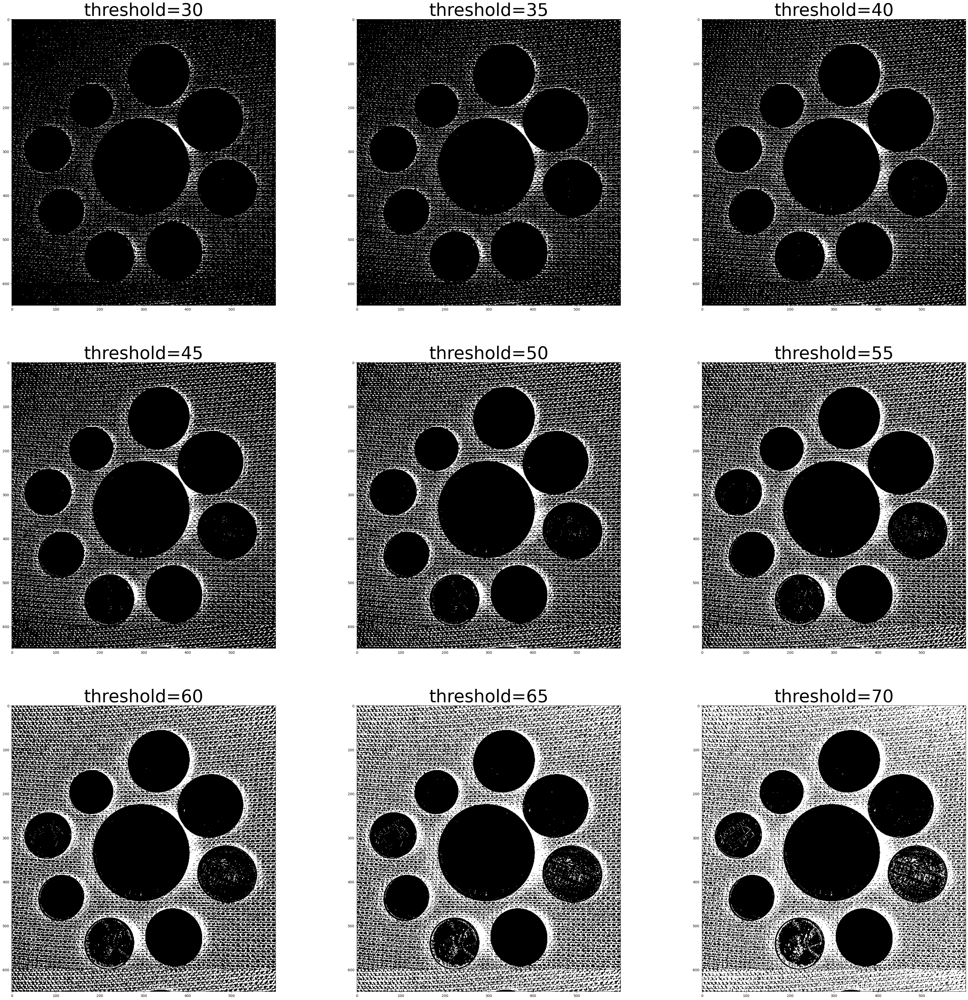

In [45]:
image_array=[]
plt.figure(figsize=(50,50))

imrow=3
imcol=3
start=30
end=71
for thresh in range(start,end,5):
    th, dst = cv2.threshold(imageGray, thresh, maxValue, cv2.THRESH_BINARY_INV)
    image_array.append(dst)
    
for i in range(9):
    plt.subplot(imrow, imcol, i + 1)
    plt.imshow(image_array[i])
    plt.title("threshold={}".format(start+i*5), size=50)
    
plt.show()

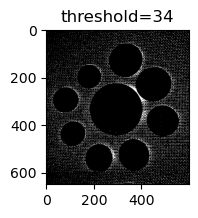

In [46]:
#Final selection
thresh=34
th, threshedIm = cv2.threshold(imageGray, thresh, maxValue, cv2.THRESH_BINARY_INV)
plt.imshow(threshedIm); plt.title("threshold={}".format(thresh)); plt.show()

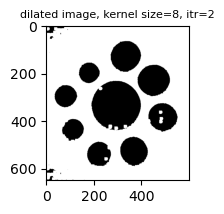

In [47]:
#Dilation on thresholded image
kdSize = (8,8)
kernel_d = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize)
itr=2
# Apply dilate function on the input image

dilatedIm = cv2.dilate(threshedIm, kernel_d, iterations=itr)
plt.imshow(dilatedIm); plt.title("dilated image, kernel size={}, itr={}".format(kdSize[0],itr),size=8); plt.show()



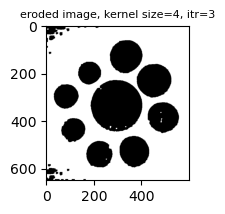

In [48]:
keSize = (4,4)
kernel_e = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, keSize)
itr=3
erodedIm=cv2.erode(dilatedIm, kernel_e, iterations=itr)
plt.imshow(erodedIm); plt.title("eroded image, kernel size={}, itr={}".format(keSize[0],itr),size=8); plt.show()

In [49]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [50]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

In [51]:
keypoints = detector.detect(erodedIm)

In [52]:
print(len(keypoints))

9


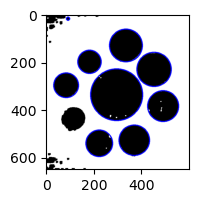

In [53]:
blobIm = cv2.cvtColor(erodedIm, cv2.COLOR_GRAY2BGR)
 
# Mark blobs using image annotation concepts we have studied so far
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.circle(blobIm,(x,y),5,(0,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(blobIm,(x,y),radius,(255,0,0),3)
    
plt.imshow(blobIm[:,:,::-1])